Fri Jul 4th 2025,
Jakob Balkovec

# Patch Extraction (FGADR Seg-set) Continued

```python
{
  "Total_Images": 1,842,
  "Lesion_Masks_Pixel_Level_Annotations": [
    "Microaneurysms_Masks",
    "Hemorrhages_Masks",
    "HardExudate_Masks",
    "SoftExudate_Masks",
    "IRMA_Masks",
    "Neovascularization_Masks"
  ],
  "Original_Images_Directory": "Original_Images"
}
```

Mask format is direct `.png` binary masks.

In [3]:
from pathlib import Path

import cv2

from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import numpy as np
import pandas as pd

from shapely.geometry import Polygon, box
from shapely.affinity import translate



## Configuration

In [4]:
base_path = Path.cwd()
mask_root = base_path.parent / 'data' / 'Seg-set'
csv_out_path = base_path.parent / 'data' / 'csv'

IMAGE_PATH = base_path.parent / 'data' / 'Seg-set' / 'Original_Images'
CSV_FILE = base_path.parent / 'data' / 'Seg-set' / 'DR_Seg_Grading_Label.csv'

MASKS_DIRS = {
    'microaneurysms': 'Microaneurysms_Masks',
    'hemorrhages': 'Hemorrhage_Masks',
    'hard_exudates': 'HardExudate_Masks',
    'soft_exudates': 'SoftExudate_Masks',
    'irma': 'IRMA_Masks',
    'neovascularization': 'Neovascularization_Masks'
}

# cache
cached_paths = []
cached_masks = []


## Utility Functions

In [5]:
def read_images_csv(csv_path):
    # pre: file needs to be a valid path to a csv file
    # post: stripped list of first column values
    # desc: reads the csv file and returns a list of the first column values
    with open(csv_path, 'r') as file:
        lines = file.readlines()
    return [line.strip().split(',')[0] for line in lines]

def filter_summary(summary_df, min_masks=3):
    # pre: file needs to be a valid path to a csv file
    # post: returns a pandas DataFrame with the filtered contents of the csv file
    # desc: reads the csv file and returns a DataFrame for further analysis

    valid_masks = summary_df[
        (summary_df['has_mask']) & (summary_df['mask_is_black'] == False)
    ]

    grouped = valid_masks.groupby('image_name')['lesion_type'].agg(['count', list]).reset_index()
    grouped.columns = ['image_name', 'num_valid_masks', 'valid_lesions']

    filtered = grouped[grouped['num_valid_masks'] >= min_masks].reset_index(drop=True)
    return filtered

def load_masks(image_name, mask_root, lesion_types: list) -> dict:
    # pre: image_name is a string representing the image file name,
    #      mask_root is a Path object pointing to the directory containing masks
    #      and lesion_types is a list of strings representing lesion types.
    #
    # post: returns a dictionary of masks for each lesion type
    # desc: loads masks for the specified image from the given mask root directory

    # todo: check is the extracted mask is all black if it is, yeet that bih...
    masks = {}

    for lesion in lesion_types:
        folder = MASKS_DIRS[lesion]
        mask_path = mask_root / folder / image_name

        if mask_path.exists():
            mask = cv2.imread(str(mask_path), 0)
            if mask is not None and np.count_nonzero(mask) != 0:
                masks[lesion] = (mask, False)  # not black
            else:
                masks[lesion] = (None, True)   # exists but all black
        else:
            masks[lesion] = (None, "unknown")  # doesn't exist

    return masks

def load_masks_for_all_images(mask_root, lesion_types: list):
    # pre: mask_root is a Path object pointing to the directory containing masks
    #      and lesion_types is a list of strings representing lesion types.
    #
    # post: returns a dictionary with image names as keys and their corresponding masks as values
    # desc: loads masks for all images in the specified mask root directory
    image_paths = read_images_csv(CSV_FILE)
    cached_paths.extend(image_paths)  # cache the paths for later use

    masks = []

    for image in tqdm(image_paths, desc="Loading masks"):
        mask = load_masks(image, mask_root, list(MASKS_DIRS.keys()))
        masks.append(mask)

    cached_masks.extend(masks)
    return masks

def flatten_masks_to_df(masks, image_paths=cached_paths):
    # pre: image_paths is a list of image file names, masks is a list of dictionaries
    # post: returns a pandas DataFrame with flattened mask information
    # desc: flattens the masks dictionary into a DataFrame for easier analysis

    records = []
    for image_name, mask_dict in zip(image_paths, masks):
        for lesion_type, (mask, flag) in mask_dict.items():
            records.append({
                "image_name": image_name,
                "lesion_type": lesion_type,
                "mask": mask,
                "mask_is_black": flag
            })
    return pd.DataFrame(records)

def summarize_masks_for_csv(masks_df):
    # pre: masks_df is a pandas DataFrame containing mask information
    # post: stores the shape instead of the nparray
    # desc: summarizes mask information for CSV output

    summary = masks_df.copy()
    summary['has_mask'] = summary['mask'].apply(lambda m: m is not None)
    summary['mask_shape'] = summary['mask'].apply(lambda m: m.shape if m is not None else None)
    return summary.drop(columns=['mask'])

def extract_valid_masks(valid_no_of_masks_df, all_masks_df):
    # pre: valid_no_of_masks_df is a pandas DataFrame containing valid image names and lesion types,
    # post: returns a DataFrame with valid masks based on the provided DataFrame
    # desc: extracts valid masks based on the number of valid lesions per image

    valid_mask_rows = []

    for _, row in valid_no_of_masks_df.iterrows():
        image_name = row['image_name']
        valid_lesions = row['valid_lesions']

        valid_rows = all_masks_df[
            (all_masks_df['image_name'] == image_name) &
            (all_masks_df['lesion_type'].isin(valid_lesions)) &
            (all_masks_df['mask_is_black'] == False)
        ]

        valid_mask_rows.append(valid_rows)

    return pd.concat(valid_mask_rows, ignore_index=True)

def plot_images_with_masks(df, image_names, base_image_path):
    # pre: df is a pandas DataFrame containing mask information,
    # post: displays images with overlaid masks
    # desc: plots images with their corresponding masks overlaid in specified colors

    # simpler than the global dict w alpha...
    lesion_colors = {
        'microaneurysms': 'red',
        'hemorrhages': 'blue',
        'hard_exudates': 'green',
        'soft_exudates': 'orange',
        'irma': 'cyan',
        'neovascularization': 'magenta'
    }

    def overlay_masks(image, masks, lesion_colors):
    # pre: image is a numpy array representing the image, masks is a dictionary of lesion types and their corresponding polygons
    # post: returns an image with overlaid masks
    # desc: overlays masks on the image with specified colors for each lesion type

        overlay = image.copy()
        for lesion_type, polygons in masks.items():
            color = tuple(int(255 * c) for c in mcolors.to_rgb(lesion_colors.get(lesion_type, 'white'))[::-1])
            for poly in polygons:
                coords = np.array(poly.exterior.coords, dtype=np.int32)
                cv2.polylines(overlay, [coords], isClosed=True, color=color, thickness=2)
        return overlay

    def generate_polygons_from_mask(mask):
        # pre: mask is a numpy array representing the binary mask
        # post: returns a list of Polygon objects representing the contours in the mask
        # desc: generates polygons from the binary mask by finding contours

        contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        return [Polygon(cnt.squeeze()) for cnt in contours if cnt.shape[0] >= 3]

    fig, axs = plt.subplots(2, 2, figsize=(15, 15))
    axs = axs.flatten()

    for idx, image_name in enumerate(image_names):
        image_path = base_image_path / image_name
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        masks = df[df['image_name'] == image_name]
        polygons_by_lesion = {}

        for _, row in masks.iterrows():
            if isinstance(row['mask'], np.ndarray):
                polygons = generate_polygons_from_mask(row['mask'])
                if polygons:
                    polygons_by_lesion.setdefault(row['lesion_type'], []).extend(polygons)

        overlayed_image = overlay_masks(image, polygons_by_lesion, lesion_colors)
        axs[idx].imshow(overlayed_image)
        axs[idx].set_title(image_name)
        axs[idx].axis('off')

    plt.tight_layout()
    plt.show()


## Get Good Candidates

Good candidates are images with 3 or more masks, that could cause overlap and labeling issues.

In [6]:
# un-comment to re-run, or else use the cached data
masks = load_masks_for_all_images(mask_root, list(MASKS_DIRS.keys()))

masks = cached_masks


Loading masks:   0%|          | 3/1842 [00:00<01:19, 23.09it/s]

Loading masks: 100%|██████████| 1842/1842 [01:14<00:00, 24.88it/s]


In [7]:
all_masks_df = flatten_masks_to_df(masks)
all_masks_df.head(n=10)


,image_name,lesion_type,mask,mask_is_black
0,0000_1.png,microaneurysms,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
1,0000_1.png,hemorrhages,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
2,0000_1.png,hard_exudates,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
3,0000_1.png,soft_exudates,None,True
4,0000_1.png,irma,None,unknown
5,0000_1.png,neovascularization,None,unknown
6,0001_2.png,microaneurysms,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
7,0001_2.png,hemorrhages,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
8,0001_2.png,hard_exudates,None,True
9,0001_2.png,soft_exudates,None,True


### Filtering the Data Frame (Images with 4+ Masks)

The following is a dataframe of images with mask shapes, where the number of masks per image is 4 or more.

In [8]:
summary_df = summarize_masks_for_csv(all_masks_df)
valid_no_of_masks_df = filter_summary(summary_df, min_masks=4)

valid_no_of_masks_df.head(n=10)


,image_name,num_valid_masks,valid_lesions
0,0003_3.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
1,0010_1.png,4,"[microaneurysms, hemorrhages, soft_exudates, i..."
2,0011_3.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
3,0015_2.png,5,"[microaneurysms, hemorrhages, hard_exudates, s..."
4,0017_2.png,5,"[microaneurysms, hemorrhages, hard_exudates, s..."
5,0024_2.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
6,0027_3.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
7,0029_1.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
8,0031_2.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."
9,0032_3.png,4,"[microaneurysms, hemorrhages, hard_exudates, s..."


### Extracting the Actual Mask

The following is a dataframe of images with masks (`np array`), where the number of masks per image is 4 or more.

In [9]:
valid_masks_extracted_df = extract_valid_masks(valid_no_of_masks_df, all_masks_df)
valid_masks_extracted_df.head(n=20)


,image_name,lesion_type,mask,mask_is_black
0,0003_3.png,microaneurysms,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
1,0003_3.png,hemorrhages,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
2,0003_3.png,hard_exudates,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
3,0003_3.png,soft_exudates,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
4,0010_1.png,microaneurysms,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
5,0010_1.png,hemorrhages,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
6,0010_1.png,soft_exudates,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
7,0010_1.png,irma,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
8,0011_3.png,microaneurysms,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False
9,0011_3.png,hemorrhages,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",False


In [10]:
valid_masks_extracted_df['image_name'].unique()[:20]


array(['0003_3.png', '0010_1.png', '0011_3.png', '0015_2.png',
       '0017_2.png', '0024_2.png', '0027_3.png', '0029_1.png',
       '0031_2.png', '0032_3.png', '0040_2.png', '0048_3.png',
       '0050_3.png', '0053_2.png', '0057_3.png', '0058_1.png',
       '0062_1.png', '0067_2.png', '0068_1.png', '0070_3.png'],
      dtype=object)

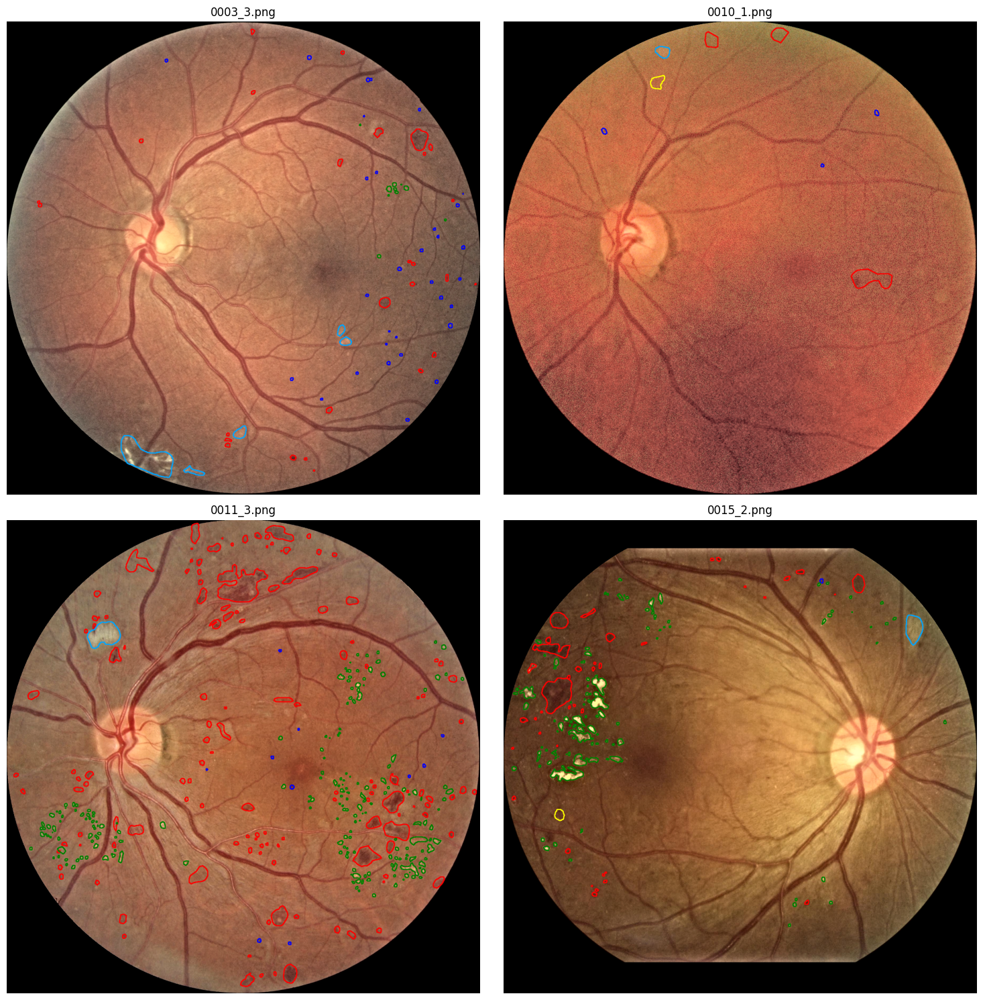

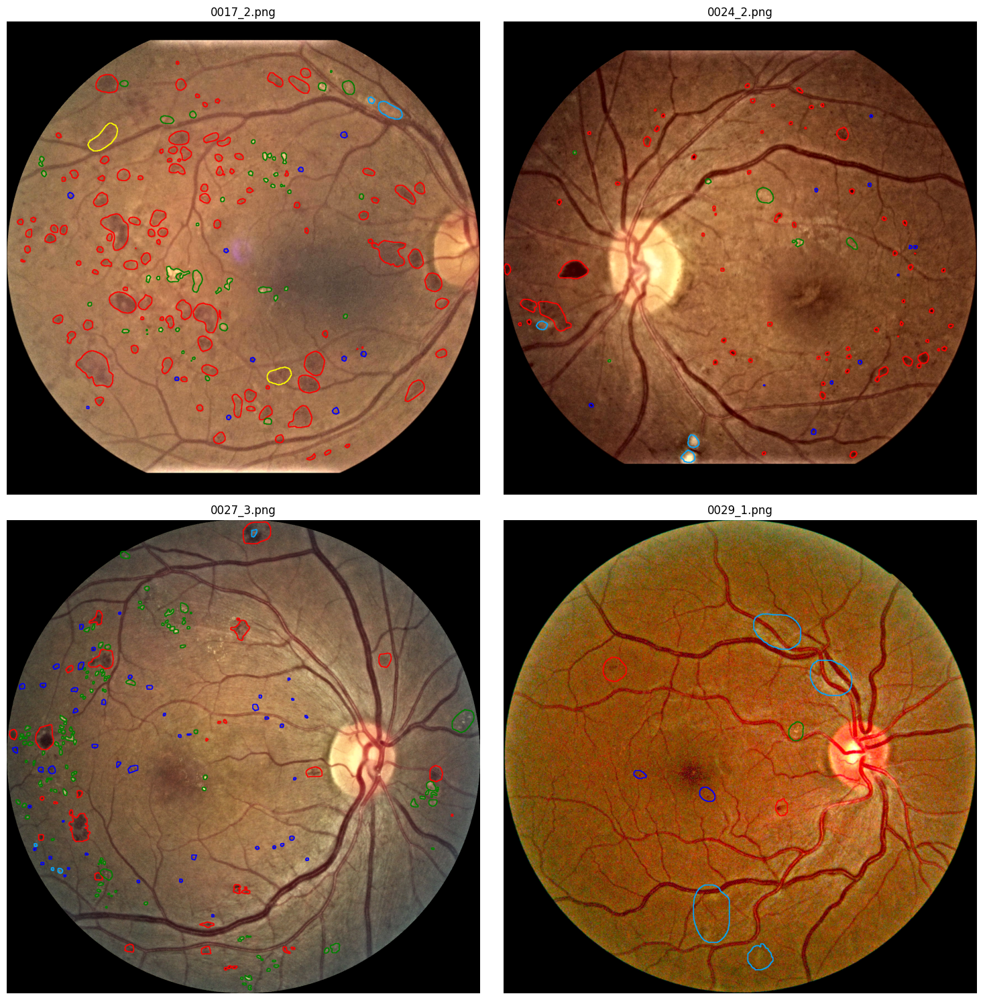

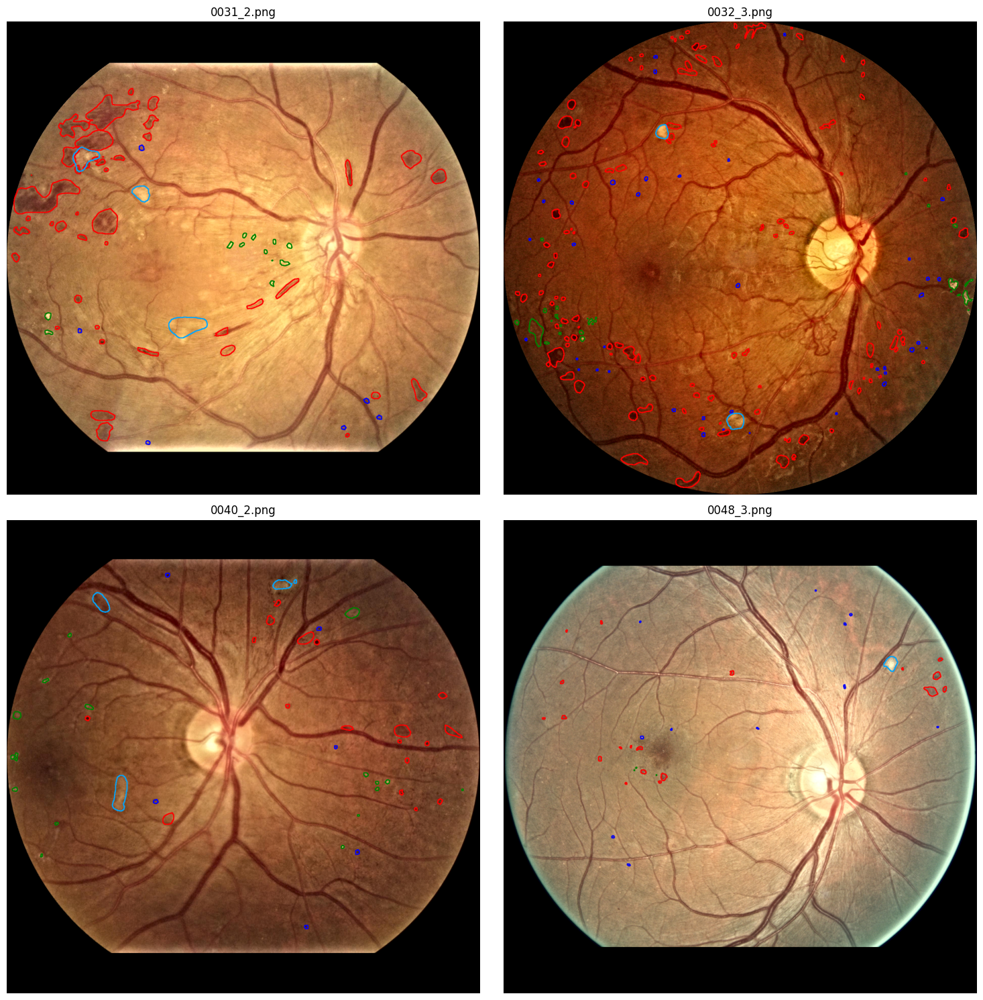

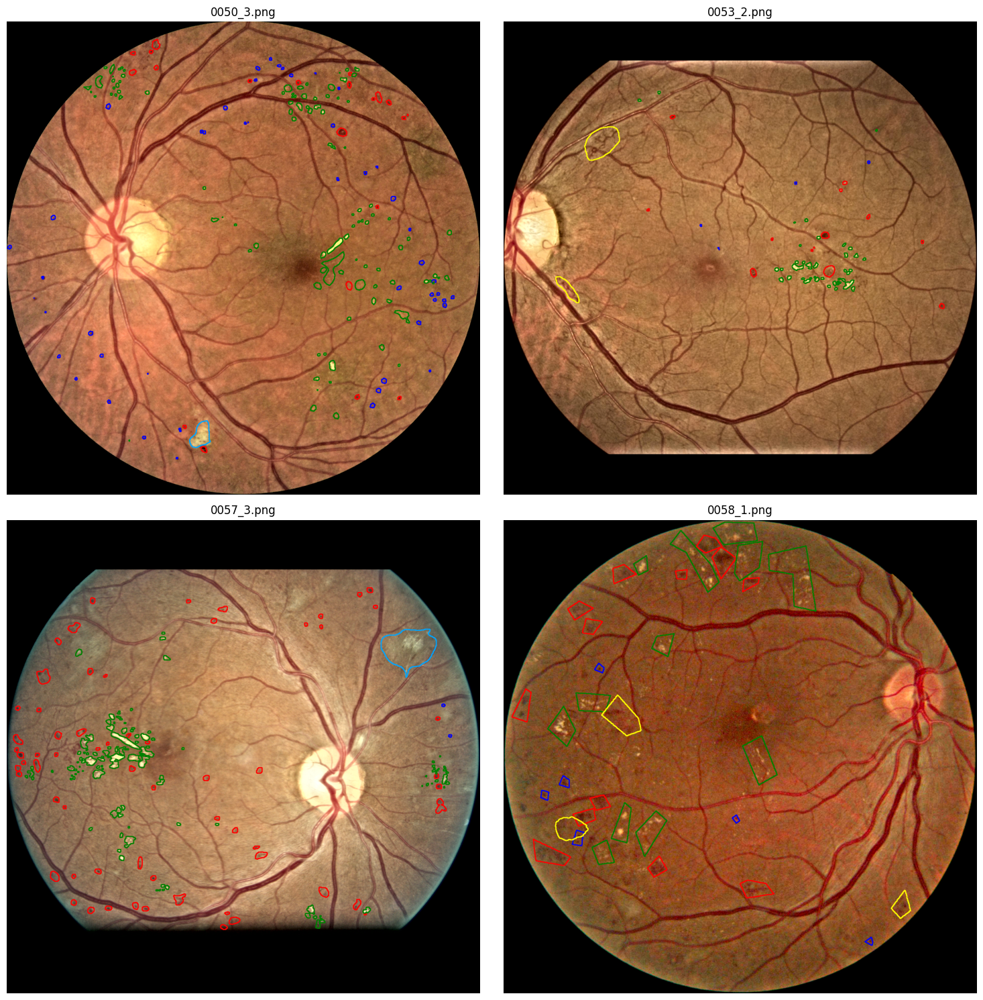

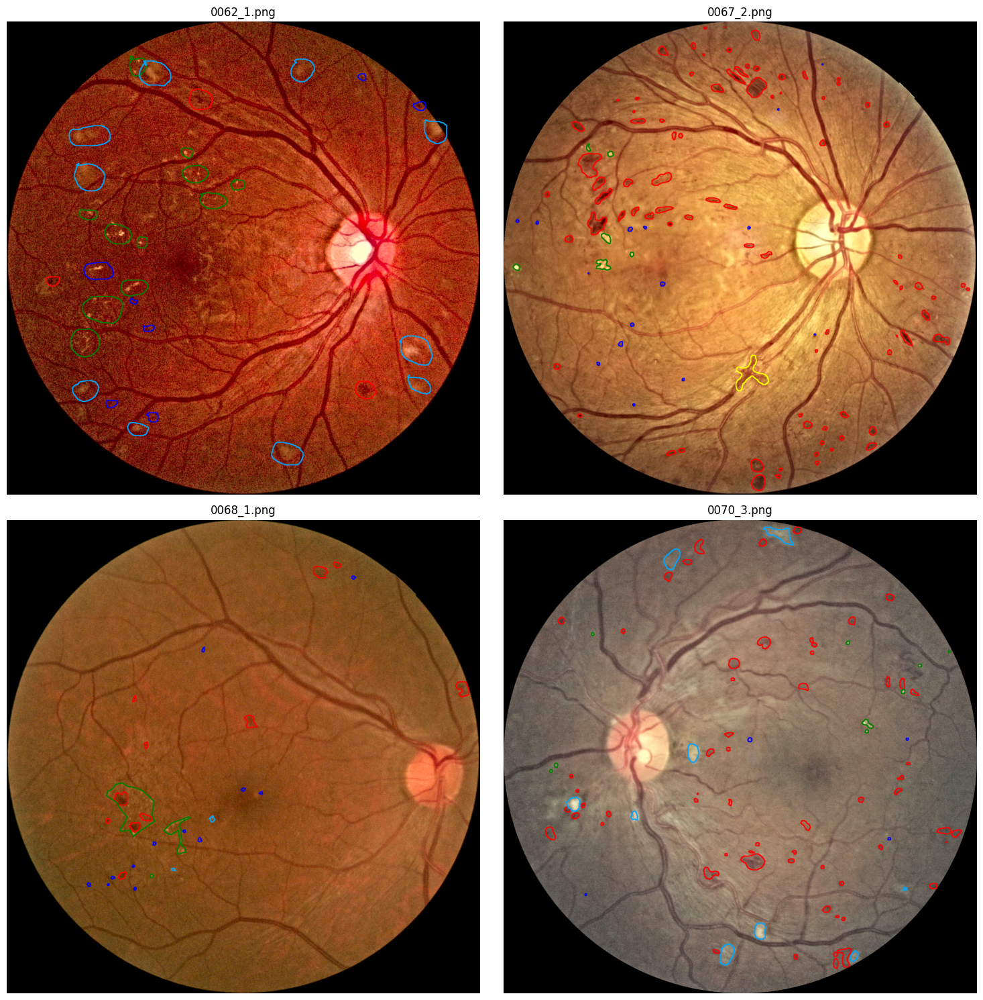

In [11]:
images_set = [['0003_3.png', '0010_1.png', '0011_3.png', '0015_2.png'],
                ['0017_2.png', '0024_2.png', '0027_3.png', '0029_1.png'],
                ['0031_2.png', '0032_3.png', '0040_2.png', '0048_3.png'],
                ['0050_3.png', '0053_2.png', '0057_3.png', '0058_1.png'],
                ['0062_1.png', '0067_2.png', '0068_1.png', '0070_3.png']]

for images in images_set:
    plot_images_with_masks(valid_masks_extracted_df, images, IMAGE_PATH)


**Exceptional Candidates**: `0068_1.png`, `0058_1.png`, `0031_2.png`